In [1]:
import numpy as np
import torch
import math
import matplotlib.pyplot as plt
import cv2
import os
from PIL import Image
from IPython.display import display
from pathlib import Path
from tqdm import tqdm
import matplotlib.pyplot as plt
import sys
from pv_vision.transform_crop.solarmodule import MaskModule
from ipywidgets import interactive, widgets, Layout
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry, SamPredictor
from scipy.signal import find_peaks, find_peaks_cwt, argrelextrema
from scipy.ndimage import gaussian_filter1d

%matplotlib inline 


In [2]:
# color RGB
green = (76, 108, 67)
purple = (124,124,186)
blue = (63, 160, 192)
grey = (105, 105, 105)

In [3]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    

In [4]:
# image_path = "/home/ne19695/Bingru Xin/2-data/field/HSB22094600064.JPG"
image_path = "/home/ne19695/Bingru Xin/2-data/test/test_4.jpg"
# image_path = "/home/ne19695/Bingru Xin/2-data/test/test_4.jpg"
dir_path = '/home/ne19695/Bingru Xin/2-data/test_400/'
dirname, filename = os.path.split(image_path)
print(dirname)
print(filename)
image = cv2.imread(image_path)

/home/ne19695/Bingru Xin/2-data/test
test_4.jpg


(-0.5, 5999.5, 3999.5, -0.5)

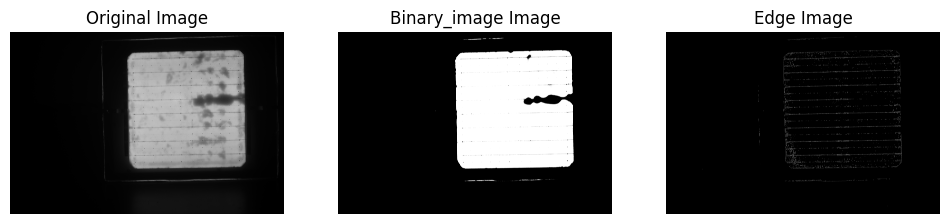

In [42]:
gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# _,binary_image = cv2.threshold(gray_img,40,256,cv2.THRESH_BINARY)
_,binary_image = cv2.threshold(gray_img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
edges = cv2.Canny(gray_img, threshold1=50, threshold2=150)
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(gray_img, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Binary_image Image')
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Edge Image')
plt.imshow(edges, cmap='gray')
plt.axis('off')


(-0.5, 5999.5, 3999.5, -0.5)

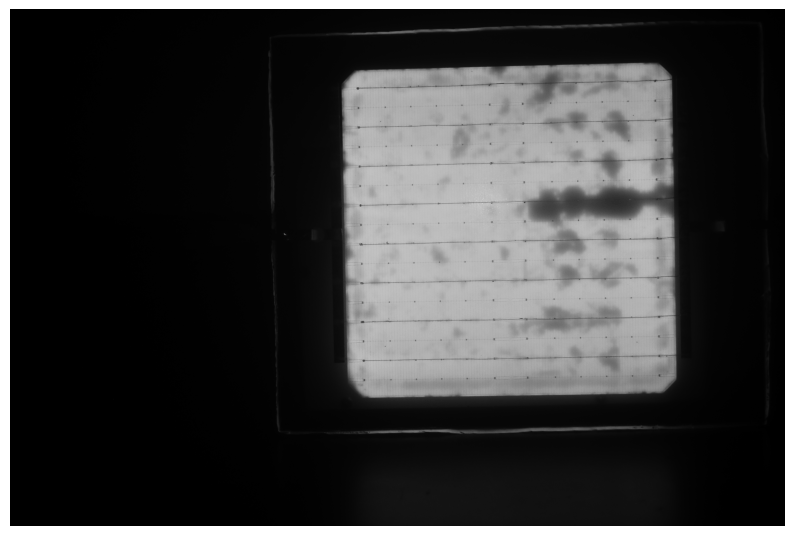

In [43]:
plt.figure(figsize=(10, 10))
plt.imshow(gray_img, cmap='gray')
plt.axis('off')

(-0.5, 5999.5, 3999.5, -0.5)

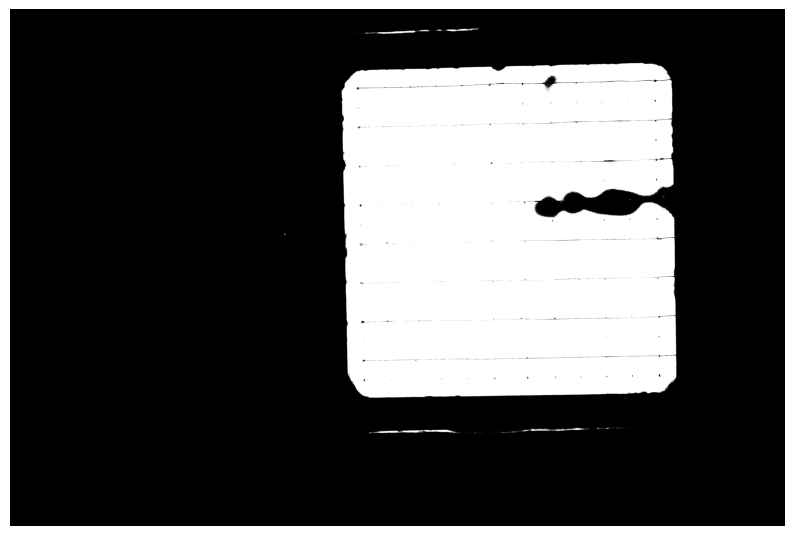

In [44]:
plt.figure(figsize=(10, 10))
plt.imshow(binary_image, cmap='gray')
plt.axis('off')

(-0.5, 5999.5, 3999.5, -0.5)

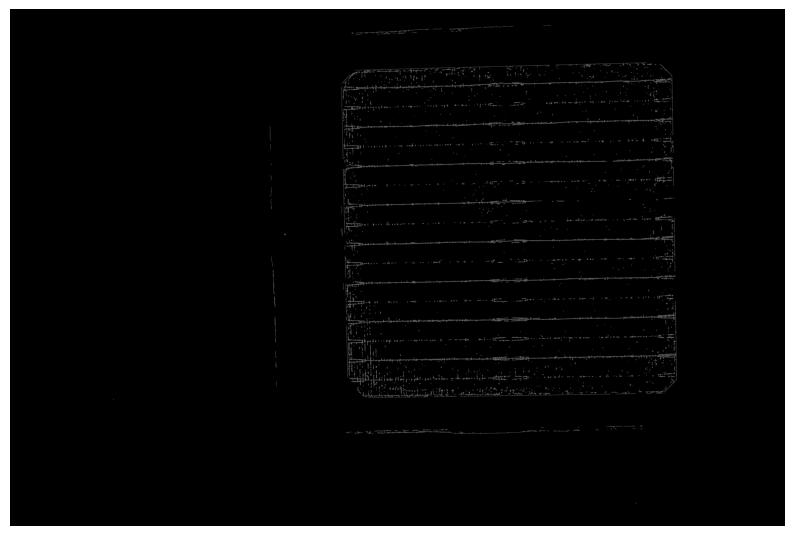

In [45]:
plt.figure(figsize=(10, 10))
plt.imshow(edges, cmap='gray')
plt.axis('off')

PV box is: [2558, 407, 5164, 3012]


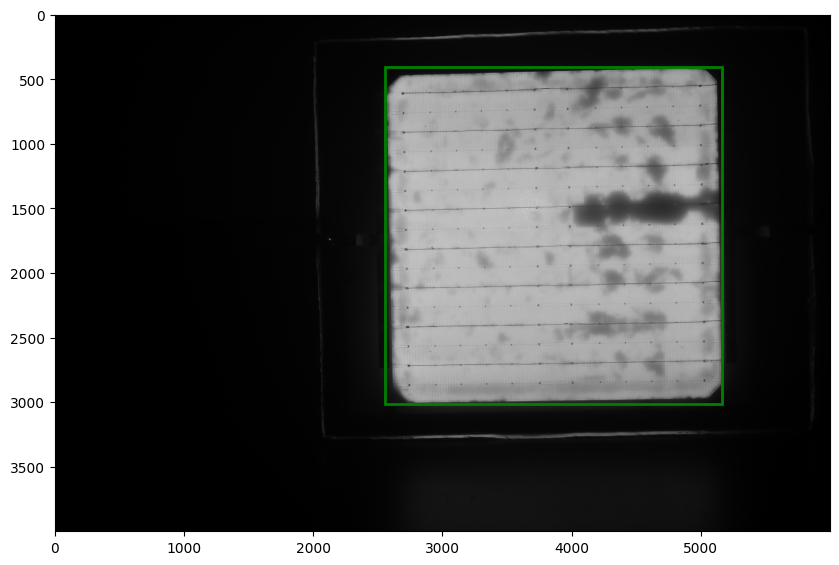

In [46]:
contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
if not contours:
   raise ValueError("No contours found, please check the parameters for image and edge detection.")
max_contour = max(contours, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(max_contour)
box = [x - 10, y - 10 , x + w + 5, y + h + 5]
# box = [270, 230, 1750, 1770]
input_box = np.array(box)
print(f"PV box is: {box}")
plt.figure(figsize=(10, 10))
plt.imshow(gray_img,cmap='gray')

show_box(input_box, plt.gca())



In [47]:

sam_checkpoint = "/home/ne19695/checkpoints/sam_vit_l_0b3195.pth"
model_type = "vit_l"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)

sam.to(device=device)

# mask_generator = SamAutomaticMaskGenerator(sam)
predictor = SamPredictor(sam)
gray_RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
predictor.set_image(gray_RGB_img)

masks, scores, logits = predictor.predict(box=input_box)
if masks is None or len(masks) == 0:
   raise ValueError("There is no mask, please check your box or model")

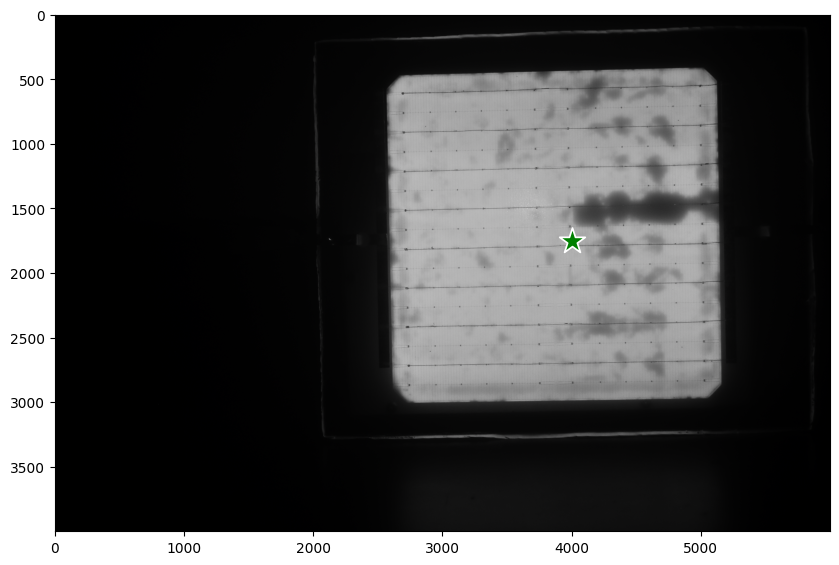

In [48]:
# input_point
input_point = np.array([(4000,1750)])
input_label = np.array([1])

plt.figure(figsize=(10, 10))
plt.imshow(gray_RGB_img,cmap='gray')
show_points(input_point,input_label, plt.gca())
plt.axis('on')
plt.show()


In [49]:
masks_2, scores_2, logits_2 = predictor.predict(point_coords = input_point, point_labels = input_label, multimask_output = True,)

In [50]:
masks_2.shape

(3, 4000, 6000)

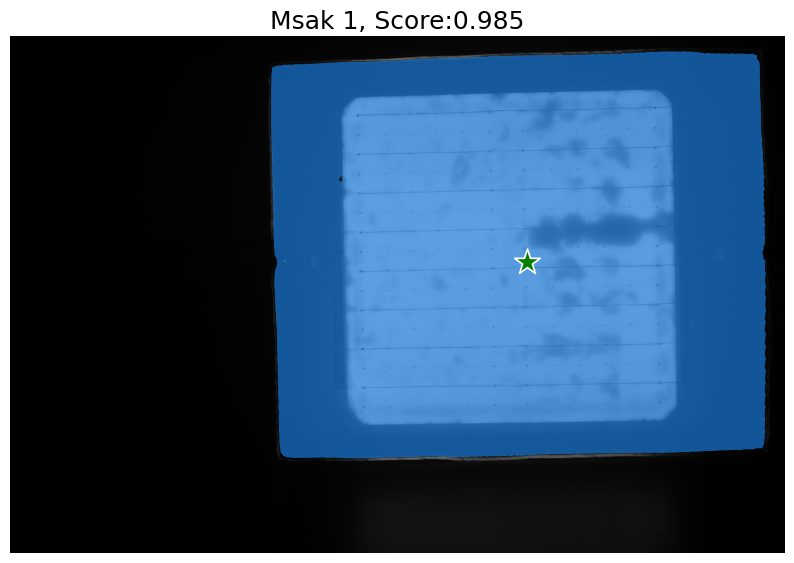

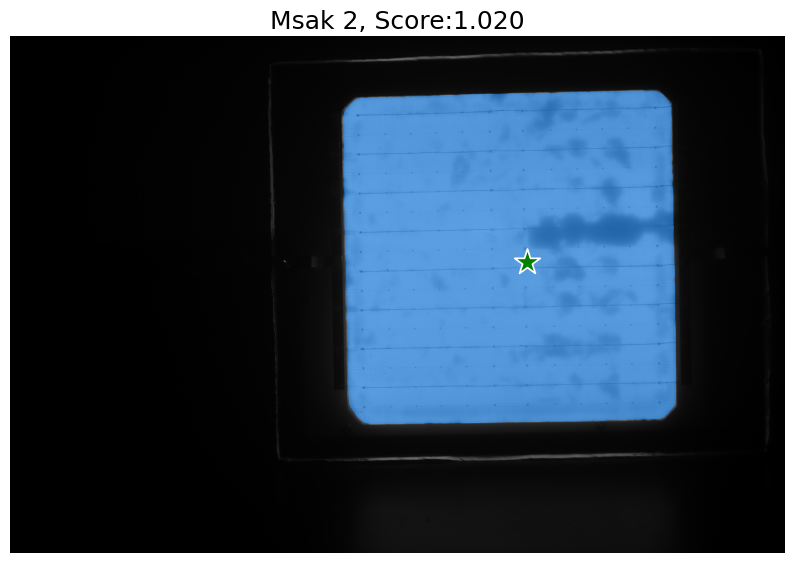

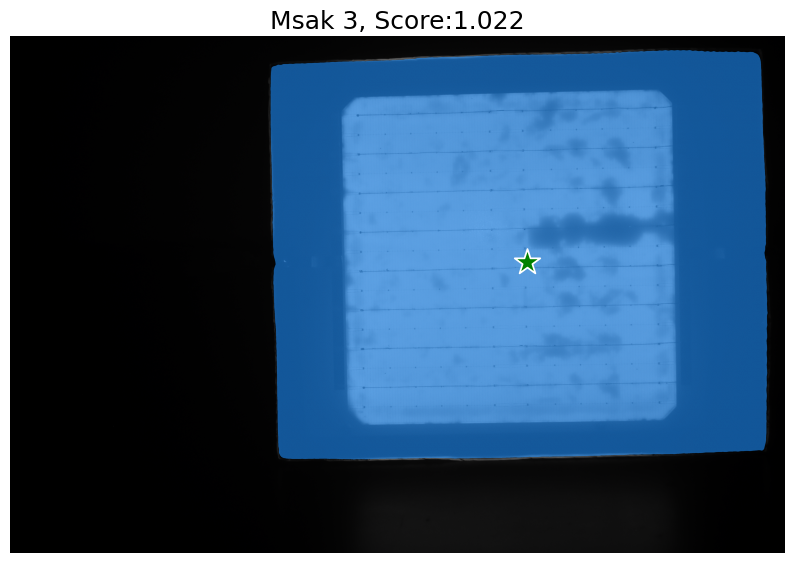

In [51]:
for i,(mask,score) in enumerate(zip(masks_2,scores_2)):
    plt.figure(figsize=(10,10))
    plt.imshow(gray_RGB_img)
    show_mask(mask, plt.gca())
    show_points(input_point,input_label, plt.gca())
    plt.title(f"Msak {i+1}, Score:{score:.3f}",fontsize=18)
    plt.axis('off')
    plt.show()


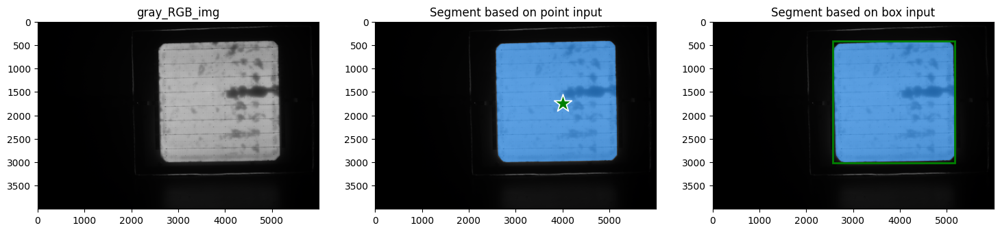

In [52]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.title('gray_RGB_img')
plt.imshow(gray_RGB_img, cmap='gray')

plt.subplot(1, 3, 2)
plt.imshow(gray_RGB_img)
plt.title('Segment based on point input')
show_mask(masks_2[1], plt.gca())
show_points(input_point,input_label, plt.gca())

plt.subplot(1, 3, 3)
plt.imshow(gray_RGB_img)
plt.title('Segment based on box input')
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())

plt.show()

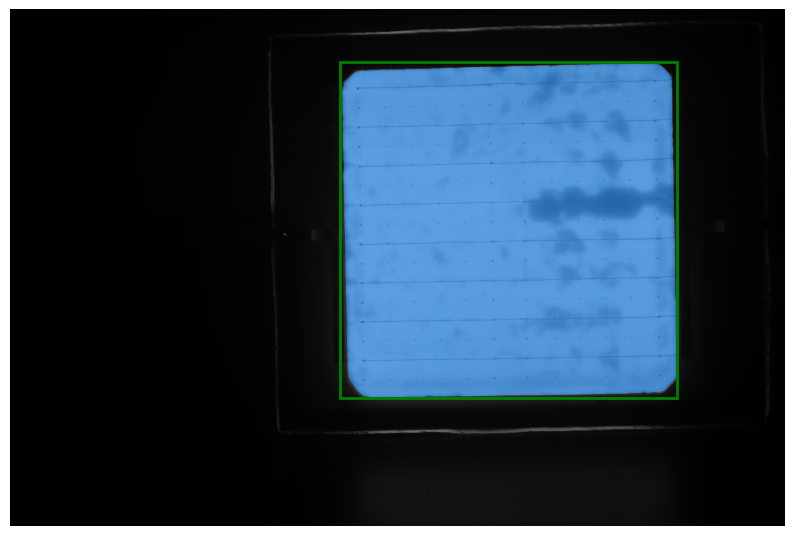

In [53]:
plt.figure(figsize=(10, 10))
plt.imshow(gray_RGB_img,cmap='gray')
plt.axis('off')
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())


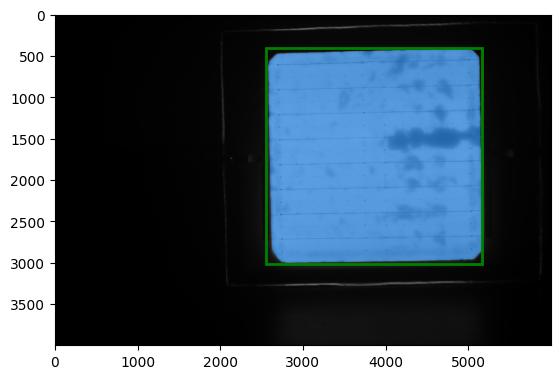

In [54]:
plt.imshow(gray_RGB_img,cmap='gray')
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.savefig(dir_path + filename[0:-4] + '_masks.png',transparent=True,dpi=300,pad_inches = 0)

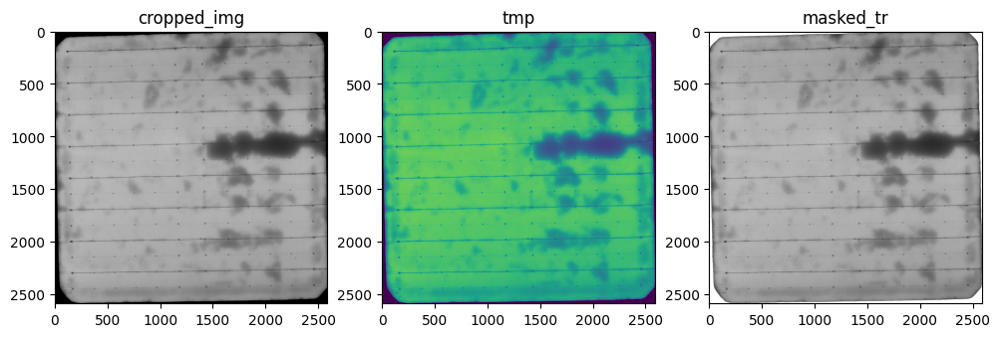

In [55]:
mask = masks[0]
mask = mask.astype(np.uint8) * 255
masked_img = cv2.bitwise_and(gray_RGB_img , gray_RGB_img , mask=mask)

contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
x, y, w, h = cv2.boundingRect(contours[0])
cropped_img = masked_img[y:y+h, x:x+w]

tmp = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)
_,alpha = cv2.threshold(tmp,10,255,cv2.THRESH_BINARY)
b, g, r = cv2.split(cropped_img)
rgba = [b,g,r, alpha]
masked_tr = cv2.merge(rgba,4)
# masked_tr[mask,3] = 0

plt.figure(figsize=(12, 10))
plt.subplot(1, 3, 1)
plt.title('cropped_img')
plt.imshow(cropped_img)

plt.subplot(1, 3, 2)
plt.title('tmp')
plt.imshow(tmp)

plt.subplot(1, 3, 3)
plt.title('masked_tr')
plt.imshow(masked_tr)

plt.show()

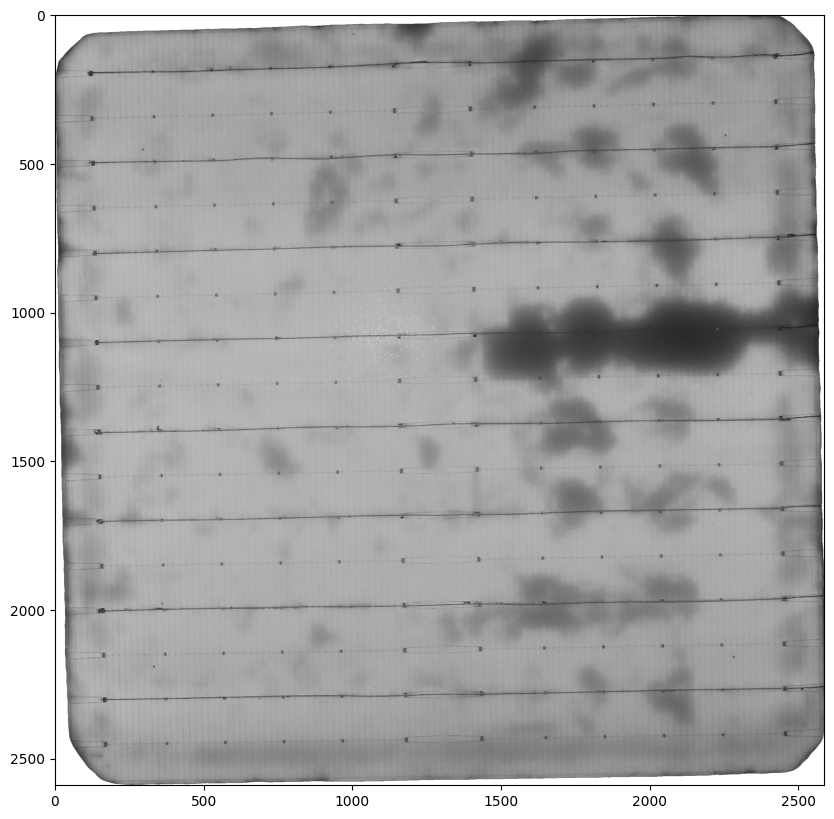

(2590, 2588, 4)


In [56]:
plt.figure(figsize=(10, 10))
plt.imshow(masked_tr)
plt.show()
print(masked_tr.shape)

In [57]:
cv2.imwrite(dir_path + filename[0:-4] + '_sam.png', masked_tr)


True

In [58]:
image = cv2.imread(dir_path + filename[0:-4] + '_sam.png', 0)
print(image.shape)
image_2 = cv2.imread(dir_path + filename[0:-4] + '_sam.png')
print(image_2.shape)
image_3 = cv2.imread(dir_path + filename[0:-4] + '_sam.png')
image_3 = cv2.cvtColor(image_3, cv2.COLOR_RGB2GRAY)
print(image_3.shape)

(2590, 2588)
(2590, 2588, 3)
(2590, 2588)


In [24]:
import cv2 as cv
image = np.array(Image.open(os.path.join(dir_path + filename[0:-4] + '_sam.png')))
# image = cv2.imread(dir_path + filename[0:-4] + '_sam.png')
image = cv.cvtColor(image,cv2.COLOR_RGB2GRAY)
#tmp_GRAY = cv.cvtColor(tmp, cv2.IMREAD_GRAYSCALE)

# raw_module = MaskModule(image, 1, 1, 8) # 6 rows && 6 columns && 3 busbar
raw_module = MaskModule(image, 1, 1, 3)
def update_mask(thre):
    mask = raw_module.load_mask(thre=thre, output=True)
    plt.figure(figsize=(8, 6))
    plt.imshow(mask, "gray")

thre = widgets.FloatSlider(value=0.05, min=0, max=1, step=0.01)

interactive(update_mask,
            thre=thre, description="Threshold")



interactive(children=(FloatSlider(value=0.05, description='thre', max=1.0, step=0.01), Output()), _dom_classes…

In [25]:
def update_corner(mode):
    corners = raw_module.corner_detection_cont(output=True, mode=mode)
    x, y = zip(*corners)

    plt.figure(figsize=(8, 6))
    plt.imshow(raw_module.mask, 'gray')
    plt.scatter(x, y, c='r',linewidths = 7)

mode=widgets.IntSlider(value=4, min=0, max=4, step=1)
interactive(update_corner,
            mode=mode)

interactive(children=(IntSlider(value=4, description='mode', max=4), Output()), _dom_classes=('widget-interact…

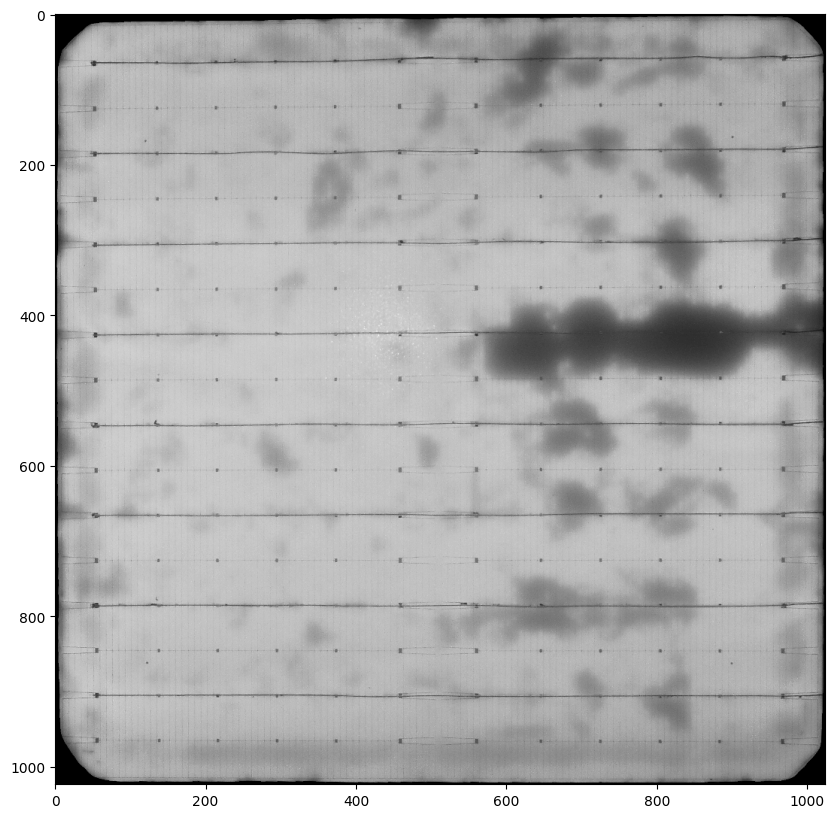

In [26]:
# cellsize can be adjusted(128, 256, 512 and so on)
img_transformed_1024 = raw_module.transform(cellsize=1024, img_only=True)
plt.figure(figsize=(10, 10))
plt.imshow(img_transformed_1024, 'gray')

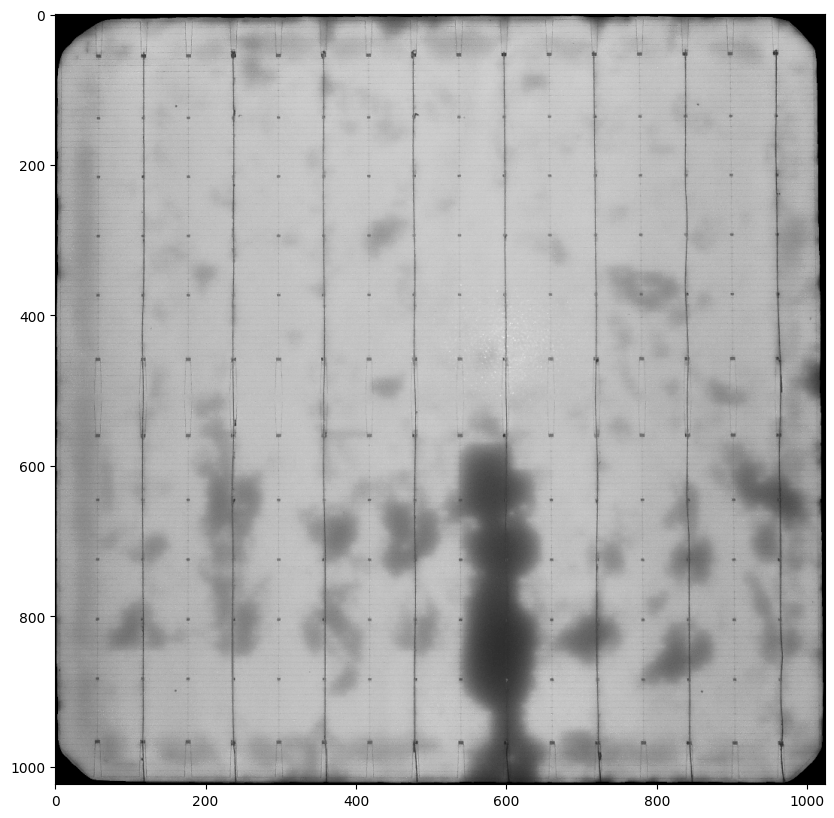

In [27]:
rotation = True
if rotation:
    img_rot_1024 = np.rot90(img_transformed_1024,-1)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rot_1024, 'gray')


In [28]:
img_transformed_1024.shape

(1024, 1024)

In [29]:
img_rot_1024.shape

(1024, 1024)

In [30]:
# save transform_image
cv2.imwrite(dir_path + filename[0:-4] + '_transform.png', img_rot_1024)

True

total percent of busbar is 1.89, and corrosion is 33.30


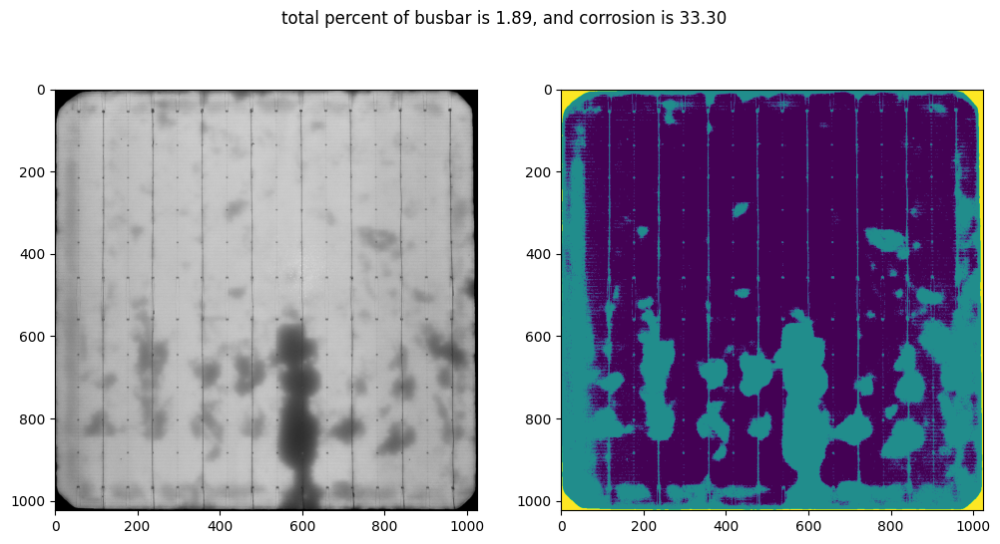

In [31]:
#calculate region based on threshold

new_img = cv2.imread(dir_path + filename[0:-4] + '_transform.png')

# new_img = cv2.imread(dir_path+filename[0:-4]+'.png')
	
new_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)

busbar_thres = 20
retal = cv2.mean(new_img)
# corrosion_thres = 125
corrosion_thres = retal[0]

# counting the number of pixels
number_of_total_pix = np.sum(new_img<=255)
number_of_busbar_pix = np.sum(new_img < busbar_thres)
number_of_good_pix = np.sum(new_img > corrosion_thres)
busbar_ratio = number_of_busbar_pix/number_of_total_pix*100
corrosion_ratio = (1-number_of_good_pix/number_of_total_pix)*100
# print('total ratio of busbar is ', number_of_busbar_pix/number_of_total_pix, ', and total ratio of corrosion is ', 1-number_of_good_pix/number_of_total_pix)

#create a mask based on thresholds
corr_mask =np.zeros(np.shape(new_img))
for i in range(0, np.shape(new_img)[0]):
    for j in range(0, np.shape(new_img)[1]):
        if new_img[i,j]< busbar_thres:
            corr_mask[i,j] = 255
        elif new_img[i,j] > corrosion_thres:
            corr_mask[i,j] = 0
        else:
            corr_mask[i,j] = 125
# plt.figure(figsize=(20, 10))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(new_img,cmap='gray')
ax2.imshow(corr_mask)
fig.suptitle('total percent of busbar is '+ str('%.2f' % busbar_ratio) + ', and corrosion is '+ str('%.2f' % corrosion_ratio))
print('total percent of busbar is '+ str('%.2f' % busbar_ratio) + ', and corrosion is '+ str('%.2f' % corrosion_ratio))


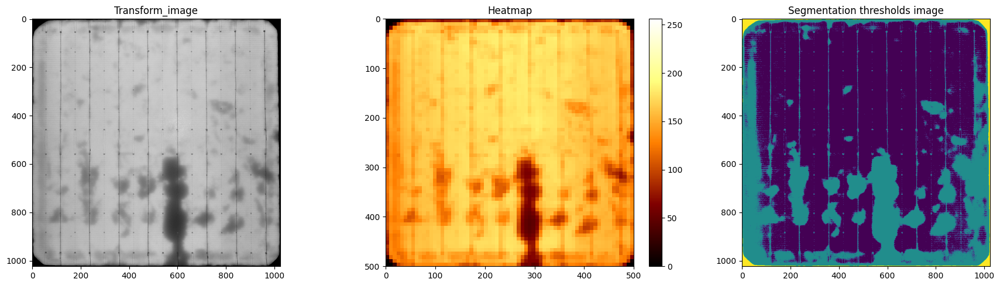

In [32]:
# heatmap plt
import matplotlib.colors as mcolors

grid_size = 15
np_img = np.asarray(cv2.imread(dir_path + filename[0:-4] + '_transform.png'))
height, width, _ =  np_img.shape
grid_height = height // grid_size 
grid_width = width // grid_size 

heatmap = np.zeros((grid_height,grid_width))

for i in range(grid_height):
    for j in range(grid_width):
        start_h = i * grid_size
        end_h = (i + 1) * grid_size
        start_w = j * grid_size
        end_w = (j + 1) * grid_size

        grid_pixels = np_img[start_h:end_h, start_w:end_w, : ]
        avg_value = np.mean(grid_pixels)

        heatmap[i , j] = avg_value

# Grayscale value
img = new_img.copy()

greyScale_map = cv2.calcHist([img], [0], None, [256], [1, 256]).squeeze()

plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.title('Transform_image')
plt.imshow(new_img,cmap='gray')
# plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Segmentation thresholds image')
plt.imshow(corr_mask)
# plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Segmentation thresholds image')
plt.imshow(heatmap, cmap='afmhot', interpolation='nearest', norm=mcolors.Normalize(vmin=0,vmax=256),extent=[0,500,500,0])
plt.colorbar(fraction=0.05, pad=0.05)
plt.title('Heatmap')
# plt.axis('off')

'''
plt.subplot(2, 1, 2)
plt.bar(range(len(greyScale_map)), greyScale_map, color='gray')
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
'''
plt.tight_layout()
plt.show()


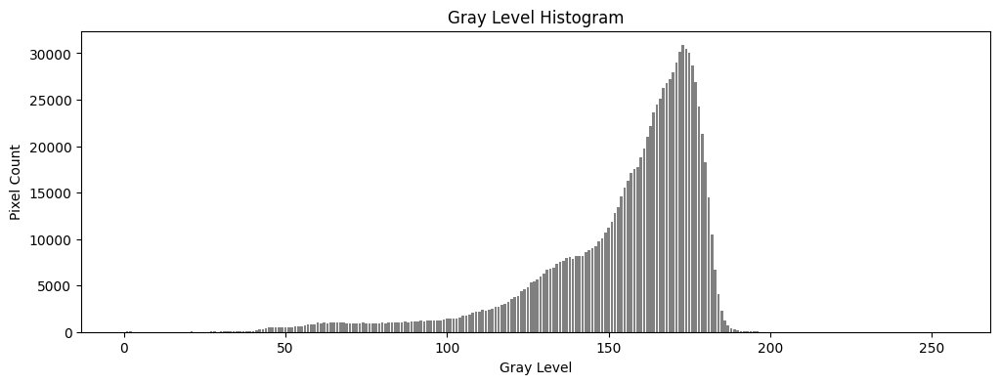

In [33]:
import cv2 as cv
import matplotlib.pyplot as plt
 
src = cv.imread(dir_path + filename[0:-4] + '_transform.png', 0)  # 直接以灰度图方式读入
img = src.copy()
 
# 统计灰度图
greyScale_map = cv.calcHist([img], [0], None, [256], [1, 256]).squeeze()
 
# 绘制灰度图
plt.figure(figsize=(12, 4), dpi=100)
plt.bar(range(len(greyScale_map)), greyScale_map, color='gray')
plt.xlabel('Gray Level')
plt.ylabel('Pixel Count')
plt.title('Gray Level Histogram')
plt.show()

Text(0.5, 1.0, 'Normalized brightness on verticle axis (Y-axis)')

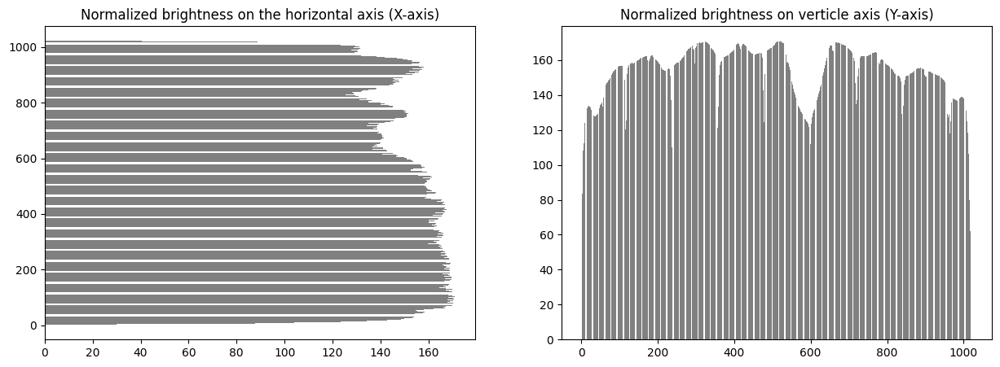

In [34]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,5))
fig.subplots_adjust(hspace=0)
hor_norm = np.average(new_img, axis=1)
ver_norm = np.average(new_img, axis=0)

ax1.barh(range(0,len(hor_norm)), hor_norm,color='gray')
ax1.set_title('Normalized brightness on the horizontal axis (X-axis)')

ax2.bar(range(0, len(ver_norm)), ver_norm,color='gray')
ax2.set_title('Normalized brightness on verticle axis (Y-axis)')

Text(0.5, 1.0, 'Normalized brightness on verticle axis (Y-axis)')

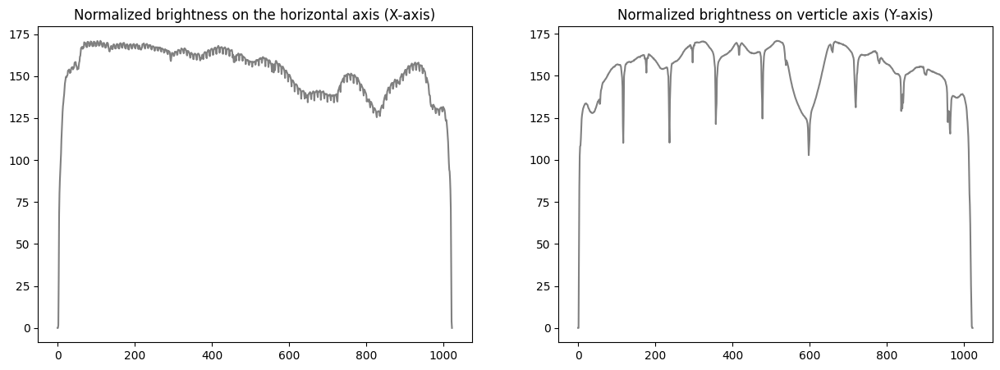

In [35]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15,5))
fig.subplots_adjust(hspace=0)
hor_norm = np.average(new_img, axis=1)
ver_norm = np.average(new_img, axis=0)

ax1.plot(range(0,len(hor_norm)), hor_norm, color='gray')
ax1.set_title('Normalized brightness on the horizontal axis (X-axis)')

ax2.plot(range(0, len(ver_norm)), ver_norm,color='gray')
ax2.set_title('Normalized brightness on verticle axis (Y-axis)')

In [36]:
new_img_1 = cv2.imread(dir_path + filename[0:-4] + '_transform.png')
print(new_img_1.shape)
new_img = cv2.cvtColor(new_img_1, cv2.COLOR_BGR2GRAY)
print(new_img.shape)
new_img

(1024, 1024, 3)
(1024, 1024)


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

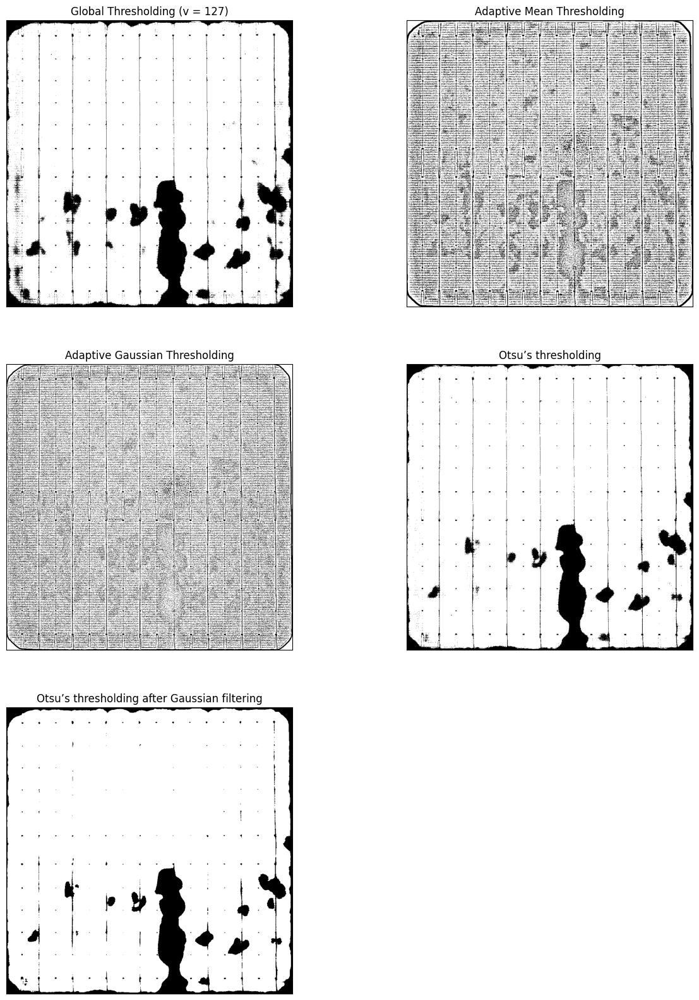

In [37]:
transform_image = Image.open(os.path.join(dir_path + filename[0:-4] + '_transform.png'))
img = cv2.cvtColor(np.asarray(transform_image), cv2.COLOR_RGB2BGR)
img.shape
img_2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret,th1 = cv2.threshold(img_2,125,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img_2 ,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img_2 ,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)
ret,th4 = cv2.threshold(img_2,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret,th5 = cv2.threshold(cv2.GaussianBlur(img_2,(5,5),0),0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

'''
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding',
            'Otsu’s thresholding', 'Otsu’s thresholding after Gaussian filtering']
'''

titles = ['Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding',
            'Otsu’s thresholding', 'Otsu’s thresholding after Gaussian filtering']

# images = [img, th1, th2, th3, th4, th5]
images = [th1, th2, th3, th4, th5]

plt.figure(figsize=(15, 20))
for i in range(5):
    plt.subplot(3,2,i+1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()



(1024, 1024)


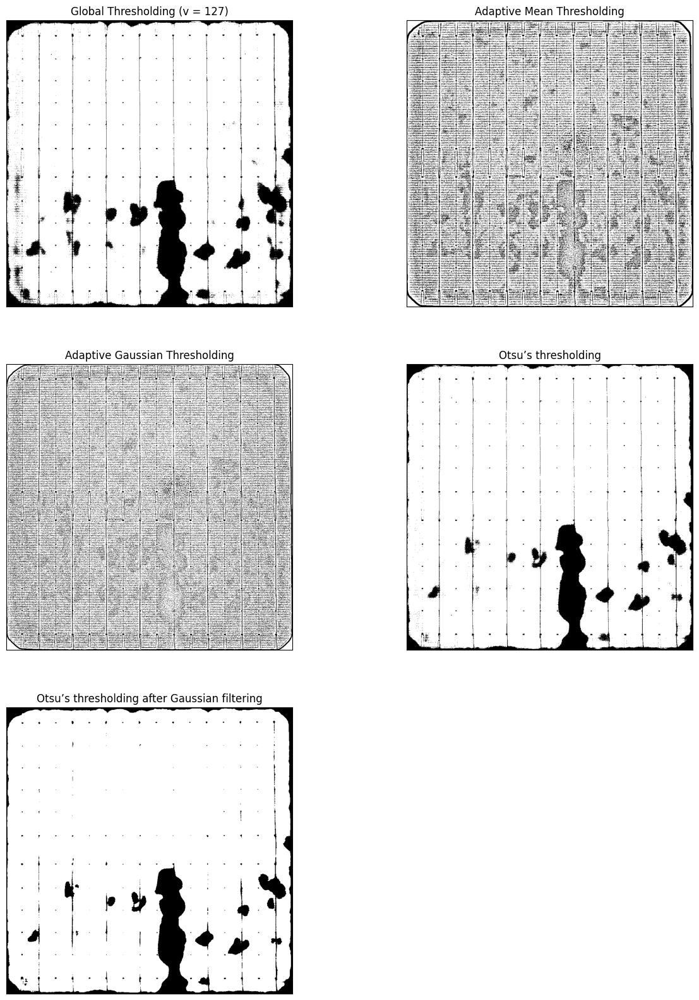

In [38]:
#calculate region based on threshold
new_img = cv2.imread(dir_path + filename[0:-4] + '_transform.png')
# new_img = cv2.imread(dir_path+filename[0:-4]+'.png')
new_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
print(new_img.shape)
ret,th1 = cv2.threshold(new_img,125,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(new_img ,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(new_img ,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)
ret,th4 = cv2.threshold(new_img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret,th5 = cv2.threshold(cv2.GaussianBlur(new_img,(5,5),0),0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

'''
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding',
            'Otsu’s thresholding', 'Otsu’s thresholding after Gaussian filtering']
'''

titles = ['Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding',
            'Otsu’s thresholding', 'Otsu’s thresholding after Gaussian filtering']

# images = [img, th1, th2, th3, th4, th5]
images = [th1, th2, th3, th4, th5]

plt.figure(figsize=(15, 20))
for i in range(5):
    plt.subplot(3,2,i+1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
plt.show()

In [39]:
cv2.imwrite(dir_path + filename[0:-4] + '_test_th5.png', th5)

True

In [40]:
kernel = np.ones((5, 5), np.uint8)
# 加粗
img_erosion = cv2.erode(th4, kernel, iterations=1) 
# 平滑消除
img_dilation = cv2.dilate(th4, kernel, iterations=1) 

In [41]:
from scipy.signal import find_peaks, find_peaks_cwt, argrelextrema

from scipy.ndimage import gaussian_filter1d

mean_intensity = np.mean(th4, axis=0)
smoothed_intensity = mean_intensity
smoothed_intensity = gaussian_filter1d(mean_intensity, sigma=2)
inverse_intensity = - smoothed_intensity
print(inverse_intensity)
inverse_intensity.shape

[-20.10412784 -32.22923681 -54.65547048 ...  -5.23630009  -1.89154321
  -0.6831036 ]


(1024,)

[-20.10412784 -32.22923681 -54.65547048 ...  -5.23630009  -1.89154321
  -0.6831036 ]
Dark region 1: width = 30 pixels
Left zero-slope point at x = 102, Right zero-slope point at x = 132 , [102, 132]
Dark region 2: width = 33 pixels
Left zero-slope point at x = 218, Right zero-slope point at x = 251 , [218, 251]
Dark region 3: width = 20 pixels
Left zero-slope point at x = 345, Right zero-slope point at x = 365 , [345, 365]
Dark region 4: width = 62 pixels
Left zero-slope point at x = 427, Right zero-slope point at x = 489 , [427, 489]
Dark region 5: width = 124 pixels
Left zero-slope point at x = 528, Right zero-slope point at x = 652 , [528, 652]
Dark region 6: width = 77 pixels
Left zero-slope point at x = 673, Right zero-slope point at x = 750 , [673, 750]
Dark region 7: width = 84 pixels
Left zero-slope point at x = 772, Right zero-slope point at x = 856 , [772, 856]
Dark region 8: width = 57 pixels
Left zero-slope point at x = 931, Right zero-slope point at x = 988 , [931, 988]


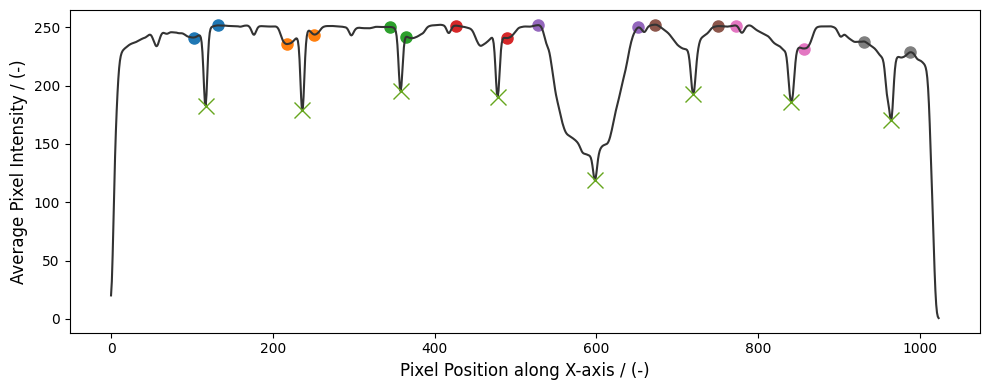

In [42]:
from scipy.signal import find_peaks, find_peaks_cwt, argrelextrema

from scipy.ndimage import gaussian_filter1d

mean_intensity = np.mean(th4, axis=0)
smoothed_intensity = mean_intensity
smoothed_intensity = gaussian_filter1d(mean_intensity, sigma=2)
inverse_intensity = - smoothed_intensity
print(inverse_intensity)

# peaks, _ = find_peaks(inverse_intensity, height= -50)

# find peaks based on distance between on busbars
# peaks, _ = find_peaks(inverse_intensity, distance = 115)

# find peaks based on prominence
peaks, _ = find_peaks(inverse_intensity, prominence=20)
# Considering that the boundary pixel value tends to be 0, this affects the slope value to be found
# Here we set it to 20
Boundary_value = 20

widths = []
zero_slope_points = []
for peak in peaks:
    left = peak
    right = peak    
    while left > Boundary_value and np.abs(smoothed_intensity[left] - smoothed_intensity[left - 1]) > 0.05:
       left -= 1
    while right < len(smoothed_intensity) - Boundary_value - 1 and np.abs(smoothed_intensity[right] - smoothed_intensity[right + 1]) > 0.05:
       right += 1
    zero_slope_points.append((left, right))

       # 计算宽度
    width = right - left
    widths.append(width)

plt.figure(figsize=(10, 4)) 

for i, (width, (left, right)) in enumerate(zip(widths, zero_slope_points)):
   print(f"Dark region {i+1}: width = {width} pixels")
   print(f"Left zero-slope point at x = {left}, Right zero-slope point at x = {right} , [{left}, {right}]")
   # 在图中标记斜率接近于零的点
   plt.plot([left, right], [smoothed_intensity[left], smoothed_intensity[right]], 'o',markersize='8')
plt.plot(smoothed_intensity, color='#333333', label='Smoothed Intensity')
plt.plot(peaks, smoothed_intensity[peaks], "x", markersize='12', markeredgecolor='#66A61E' ,label='Dark Region Centers')
plt.xlabel('Pixel Position along X-axis / (-)',fontsize=12)
plt.ylabel('Average Pixel Intensity / (-)',fontsize=12)

plt.tight_layout()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, \
    wspace=None, hspace=0.45)



Text(0, 0.5, 'Average Pixel Intensity / (-)')

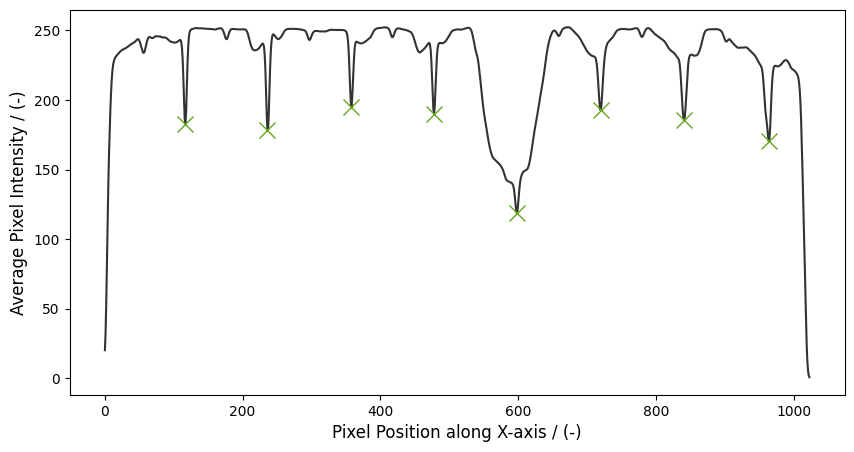

In [43]:
mean_intensity = np.mean(th4, axis=0)
smoothed_intensity = mean_intensity
smoothed_intensity = gaussian_filter1d(mean_intensity, sigma=2)
inverse_intensity = - smoothed_intensity
    # peaks, _ = find_peaks(inverse_intensity, height= -50)
    # find peaks based on distance between on busbars
    # peaks, _ = find_peaks(inverse_intensity, distance = 115)

    # find peaks based on prominence
peaks, _ = find_peaks(inverse_intensity, prominence=20)
    

fig, ax = plt.subplots(figsize=(10,5))

ax.plot(smoothed_intensity, color='#333333', label='Smoothed Intensity')
ax.plot(peaks, smoothed_intensity[peaks], "x", markersize='12', markeredgecolor='#66A61E' ,label='Dark Region Centers')
ax.set_xlabel('Pixel Position along X-axis / (-)',fontsize=12)
ax.set_ylabel('Average Pixel Intensity / (-)',fontsize=12)


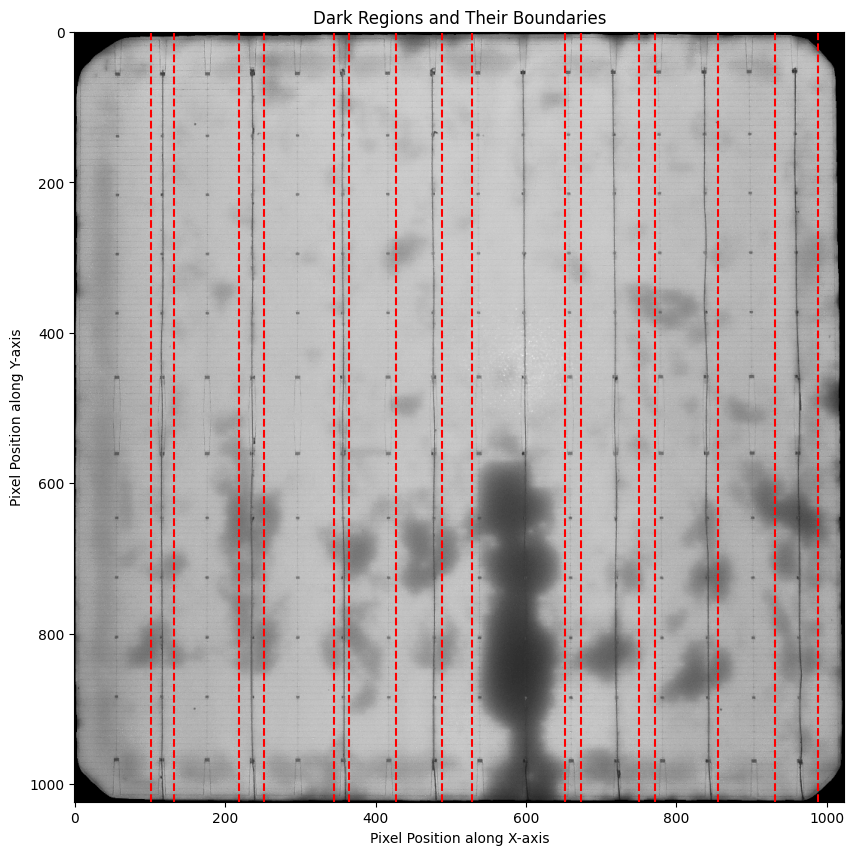

In [44]:
plt.figure(figsize=(10, 10)) 
plt.imshow(new_img, cmap='gray')
for i, (left, right) in enumerate(zero_slope_points):
   peak = peaks[i]
   plt.axvline(x=left, color='red', linestyle='--')
   plt.axvline(x=right, color='red', linestyle='--')
   # plt.axvline(x=peak, color='green', linestyle='-')

    
plt.title('Dark Regions and Their Boundaries')
plt.xlabel('Pixel Position along X-axis')
plt.ylabel('Pixel Position along Y-axis')
plt.show()

In [45]:
peaks

array([117, 236, 358, 478, 598, 720, 841, 964])

In [46]:
len(peaks)

8

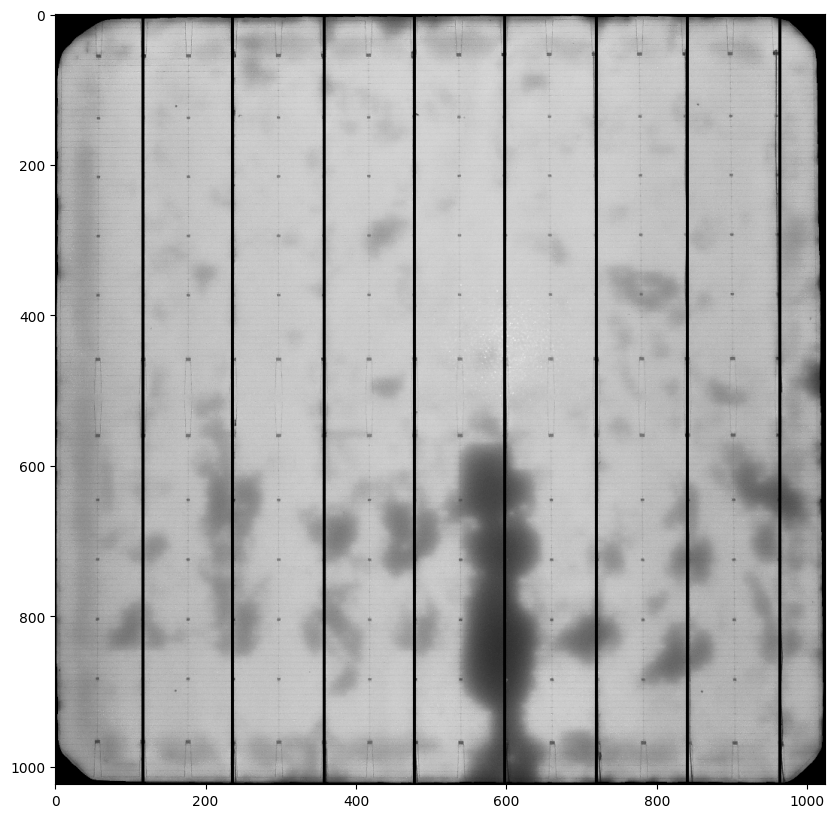

In [47]:
mask_busbar = np.ones(img_rot_1024.shape[:2], dtype=np.uint8)

lines_box_1 =[peaks[0]-2, 0, peaks[0]+2, 1024]
lines_box_1_np = np.array(lines_box_1)

lines_boxes = []
for i in range(len(peaks)):
    new_a = peaks[i]-2
    new_c = peaks[i]+2
    new_box = [new_a, 0, new_c, 1024]
    lines_boxes.append(new_box)
    mask_busbar[0:1024, new_a : new_c] = 0
    masked_image = cv2.bitwise_and(img_rot_1024, img_rot_1024, mask=mask_busbar)


plt.figure(figsize=(10, 10))
plt.imshow(img_rot_1024,'gray')
plt.imshow(masked_image, cmap='gray')

box_1 = [115, 0, 119, 1024]
box_2 = [234, 0, 238, 1024]
box_3 = [356, 0, 360, 1024]
box_4 = [476, 0, 480, 1024]
box_5 = [596, 0, 600, 1024]
box_6 = [718, 0, 722, 1024]
box_7 = [839, 0, 843, 1024]
box_8 = [962, 0, 966, 1024]


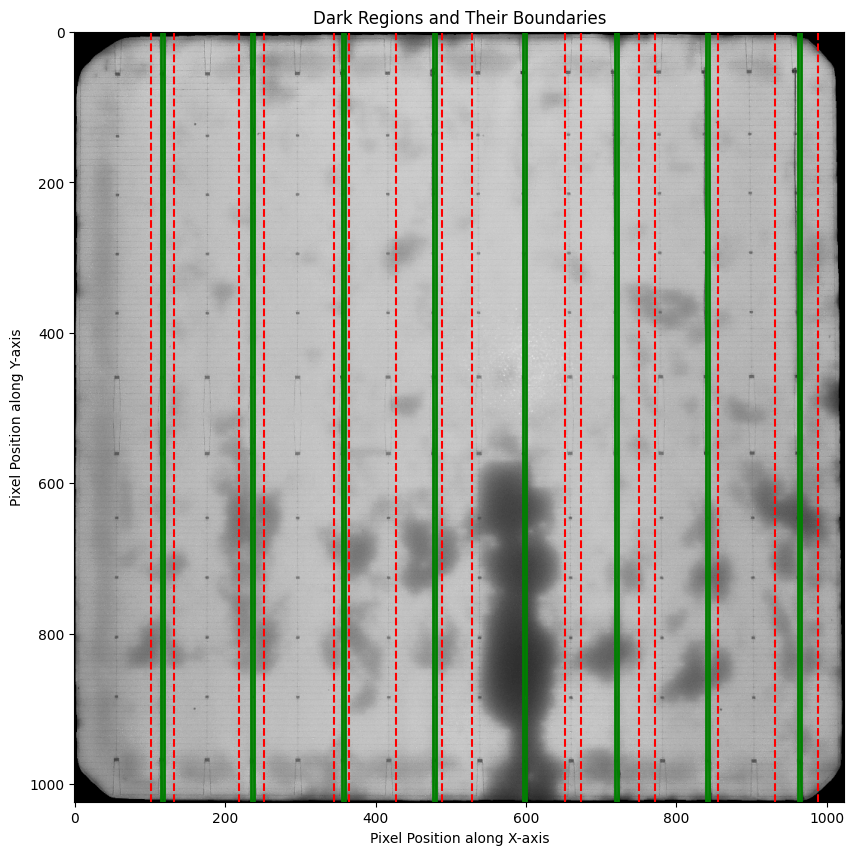

In [48]:
# busbar_box 可视化
mask_busbar = np.ones(img_rot_1024.shape[:2], dtype=np.uint8)

lines_box_1 =[peaks[0]-2, 0, peaks[0]+2, 1024]
lines_box_1_np = np.array(lines_box_1)

lines_boxes = []
for i in range(len(peaks)):
    new_a = peaks[i]-2
    new_c = peaks[i]+2
    new_box = [new_a, 0, new_c, 1024]
    lines_boxes.append(new_box)
    mask_busbar[0:1024, new_a : new_c] = 0
    masked_image = cv2.bitwise_and(img_rot_1024, img_rot_1024, mask=mask_busbar)

plt.figure(figsize=(10, 10))
plt.imshow(img_rot_1024,'gray')
for i, box_n in enumerate(lines_boxes):
    print(f'box_{i+1} = {box_n}')
    lines_box_n = np.array(box_n)
    show_box(lines_box_n, plt.gca())

for i, (left, right) in enumerate(zero_slope_points):
   peak = peaks[i]
   plt.axvline(x=left, color='red', linestyle='--')
   plt.axvline(x=right, color='red', linestyle='--')
   # plt.axvline(x=peak, color='green', linestyle='-')
    
plt.title('Dark Regions and Their Boundaries')
plt.xlabel('Pixel Position along X-axis')
plt.ylabel('Pixel Position along Y-axis')
plt.show()

In [49]:
# peak_raw_img_smoothed: array([ 60, 175, 291, 407, 523, 640, 756, 872, 986])
# peak_th1_img_smoothed: array([ 59, 175, 291, 407, 523, 640, 756, 873, 986])
# peak_th2_img_smoothed: array([ 60, 176, 291, 407, 523, 640, 756, 872, 986])
# peak_th3_img_smoothed: array([ 60, 176, 291, 407, 523, 640, 756, 872, 986])
# peak_th4_img_smoothed: array([ 60, 175, 291, 407, 523, 640, 756, 873, 986])
# peak_th5_img_smoothed: array([ 60, 175, 291, 407, 523, 640, 756, 873, 986])

In [50]:
new_img = cv2.imread(dir_path + filename[0:-4] + '_transform.png')
# new_img = cv2.imread(dir_path+filename[0:-4]+'.png')
analysis_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
analysis_img_busbar = analysis_img[mask_busbar == 0]
analysis_img_non_busbar = analysis_img[mask_busbar == 1]

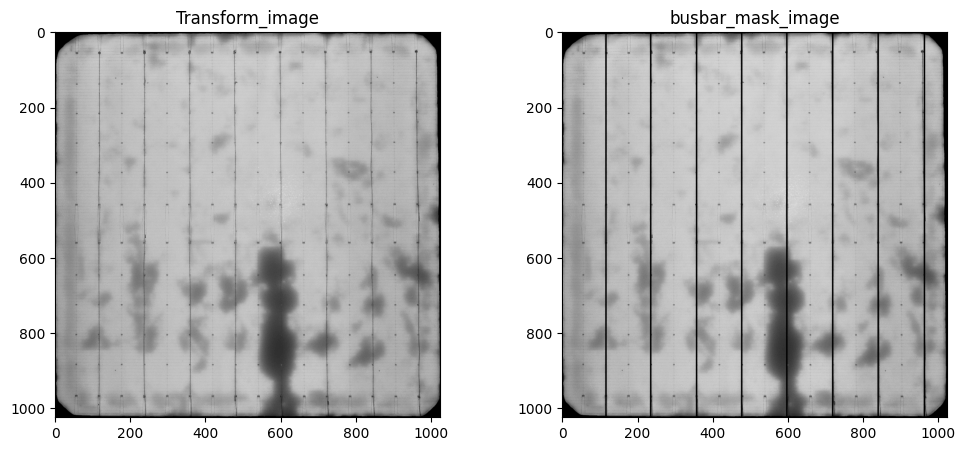

In [51]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.title('Transform_image')
plt.imshow(img_rot_1024,'gray')

plt.subplot(1, 2, 2)
plt.title('busbar_mask_image')
plt.imshow(masked_image,'gray')

148.45128917694092
total percent of busbar is 4.96 % , and corrosion is 26.57 %


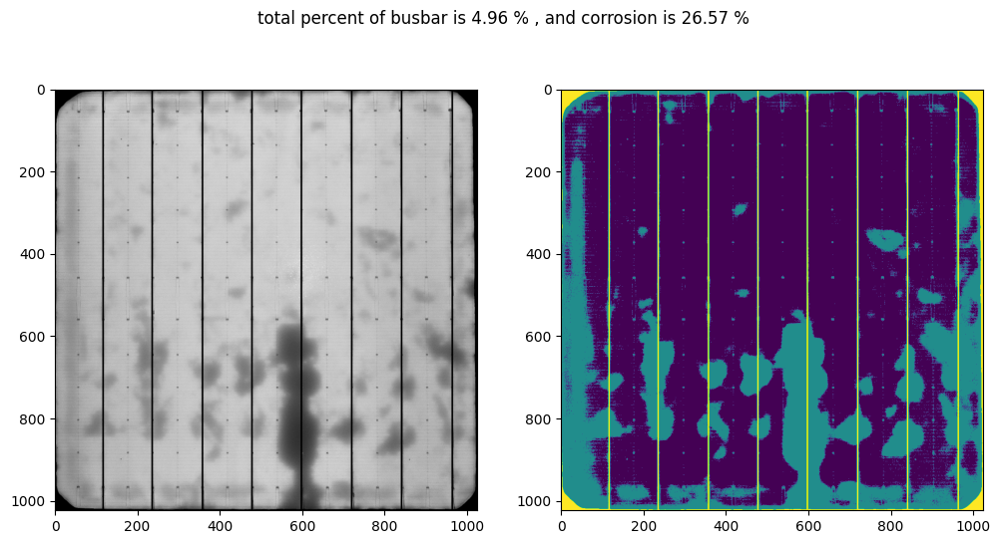

In [52]:
analysis_img = masked_image

background = 1
retal = cv2.mean(analysis_img)
# corrosion_thres = 148
corrosion_thres = retal[0]
print(corrosion_thres)
# counting the number of pixels
number_of_total_pix = np.sum(analysis_img <= 255)
number_of_busbar_pix = np.sum(analysis_img < background)
number_of_good_pix = np.sum(analysis_img > corrosion_thres)
# number_of_PV_pix
number_of_PV_pix = np.sum(analysis_img <= 255) -  np.sum(analysis_img < 1)
busbar_ratio = number_of_busbar_pix/number_of_total_pix*100
corrosion_ratio = (1-number_of_good_pix/number_of_PV_pix)*100
# print('total ratio of busbar is ', number_of_busbar_pix/number_of_total_pix, ', and total ratio of corrosion is ', 1-number_of_good_pix/number_of_total_pix)

#create a mask based on thresholds
corr_mask =np.zeros(np.shape(analysis_img))
for i in range(0, np.shape(analysis_img)[0]):
    for j in range(0, np.shape(analysis_img)[1]):
        if analysis_img[i,j]< background:
            corr_mask[i,j] = 255
        elif analysis_img[i,j] > corrosion_thres:
            corr_mask[i,j] = 0
        else:
            corr_mask[i,j] = 125
# plt.figure(figsize=(20, 10))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(analysis_img,cmap='gray')
ax2.imshow(corr_mask)
fig.suptitle('total percent of busbar is '+ str('%.2f' % busbar_ratio) + ' % , and corrosion is '+ str('%.2f' % corrosion_ratio) + ' %')
print('total percent of busbar is '+ str('%.2f' % busbar_ratio) + ' % , and corrosion is '+ str('%.2f' % corrosion_ratio) + ' %')

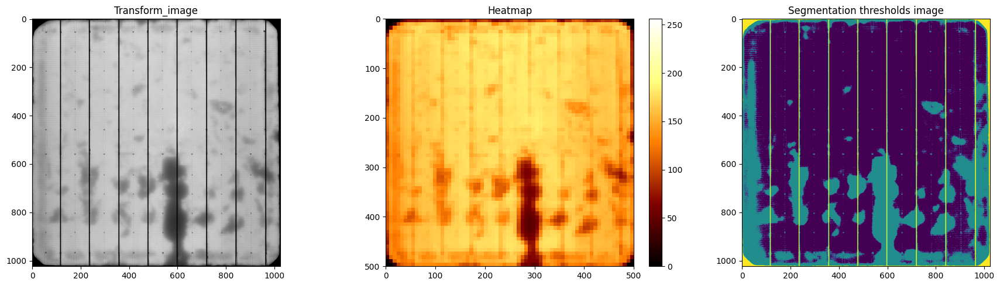

In [53]:
# heatmap plt
import matplotlib.colors as mcolors

grid_size = 15
np_img = np.asarray(cv2.imread(dir_path + filename[0:-4] + '_transform.png'))

height, width, _ =  np_img.shape
grid_height = height // grid_size 
grid_width = width // grid_size 

heatmap = np.zeros((grid_height,grid_width))

for i in range(grid_height):
    for j in range(grid_width):
        start_h = i * grid_size
        end_h = (i + 1) * grid_size
        start_w = j * grid_size
        end_w = (j + 1) * grid_size

        grid_pixels = np_img[start_h:end_h, start_w:end_w, : ]
        avg_value = np.mean(grid_pixels)

        heatmap[i , j] = avg_value

# Grayscale value
img = new_img.copy()

greyScale_map = cv.calcHist([img], [0], None, [256], [0, 256]).squeeze()

plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.title('Transform_image')
plt.imshow(analysis_img,cmap='gray')
# plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Segmentation thresholds image')
plt.imshow(corr_mask)
# plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Segmentation thresholds image')
plt.imshow(heatmap, cmap='afmhot', interpolation='nearest', norm=mcolors.Normalize(vmin=0,vmax=256),extent=[0,500,500,0])
plt.colorbar(fraction=0.05, pad=0.05)
plt.title('Heatmap')
# plt.axis('off')

'''
plt.subplot(2, 1, 2)
plt.bar(range(len(greyScale_map)), greyScale_map, color='gray')
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
'''
plt.tight_layout()
plt.show()


In [54]:
# healthiness calculations
img_filtered = np.where(masked_image < 1, 0, masked_image)

pixel_counts = np.bincount(img_filtered.flatten(),minlength=256)

#cv.minMaxLoc()函数原型
minVal, maxVal, minLoc, maxLoc = cv.minMaxLoc(masked_image)

print('The Max Pixel value of PV-EL image "'+ filename + '" is '+ str('%.2f' %  maxVal))

# The maximum pixel value is constant(255)
# max_pixel_value = 255
# The maximum pixel value of the image(based on image)
max_pixel_value = maxVal
total_pixels = masked_image.size
healthiness = np.sum(pixel_counts * np.arange(256)) / (max_pixel_value * total_pixels) * 100

print('The health of the PV-EL image "'+ filename + '" is '+ str('%.2f' % healthiness) + ' %.' )

The Max Pixel value of PV-EL image "test_4.jpg" is 224.00
The health of the PV-EL image "test_4.jpg" is 66.27 %.


In [55]:
import pandas as pd
df = pd.DataFrame(img_rot_1024)
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
count,1024.0,1024.0,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.00000,...,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.0,1024.0
mean,0.0,0.0,40.007812,83.668945,102.315430,108.115234,108.470703,112.584961,117.936523,124.21582,...,92.516602,79.916992,73.422852,62.041016,44.061523,25.131836,13.538086,0.955078,0.0,0.0
std,0.0,0.0,50.048871,51.897681,43.273586,42.367664,41.141735,40.148072,40.473938,41.37870,...,51.519186,56.306207,56.835049,56.060890,51.696565,41.576828,30.872590,6.317436,0.0,0.0
min,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,0.0,0.0,0.000000,28.750000,94.000000,102.000000,103.000000,112.000000,120.000000,126.00000,...,67.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
50%,0.0,0.0,0.000000,104.000000,118.000000,124.000000,123.000000,125.000000,131.000000,138.00000,...,114.500000,110.000000,99.000000,86.500000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
75%,0.0,0.0,90.000000,124.000000,131.000000,134.000000,133.000000,135.000000,139.000000,145.00000,...,132.000000,127.000000,126.000000,117.000000,103.000000,62.250000,0.000000,0.000000,0.0,0.0
max,0.0,0.0,161.000000,160.000000,155.000000,153.000000,157.000000,159.000000,160.000000,173.00000,...,159.000000,149.000000,155.000000,144.000000,141.000000,124.000000,116.000000,68.000000,0.0,0.0


In [56]:
# plt.savefig('/home/ne19695/Bingru Xin/2-data/Sam_PV_image/'+filename)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


31
Peak at x = 117, 1. Average pixel value in the region = 146.56 ; 2. The ratio of buabar corrosion is 17.36 %
Peak at x = 236, 1. Average pixel value in the region = 146.09 ; 2. The ratio of buabar corrosion is 29.39 %
Peak at x = 358, 1. Average pixel value in the region = 152.83 ; 2. The ratio of buabar corrosion is 17.28 %
Peak at x = 478, 1. Average pixel value in the region = 154.22 ; 2. The ratio of buabar corrosion is 16.22 %
Peak at x = 598, 1. Average pixel value in the region = 123.31 ; 2. The ratio of buabar corrosion is 45.05 %
Peak at x = 720, 1. Average pixel value in the region = 152.05 ; 2. The ratio of buabar corrosion is 16.97 %
Peak at x = 841, 1. Average pixel value in the region = 141.17 ; 2. The ratio of buabar corrosion is 28.09 %
Peak at x = 964, 1. Average pixel value in the region = 132.20 ; 2. The ratio of buabar corrosion is 51.62 %


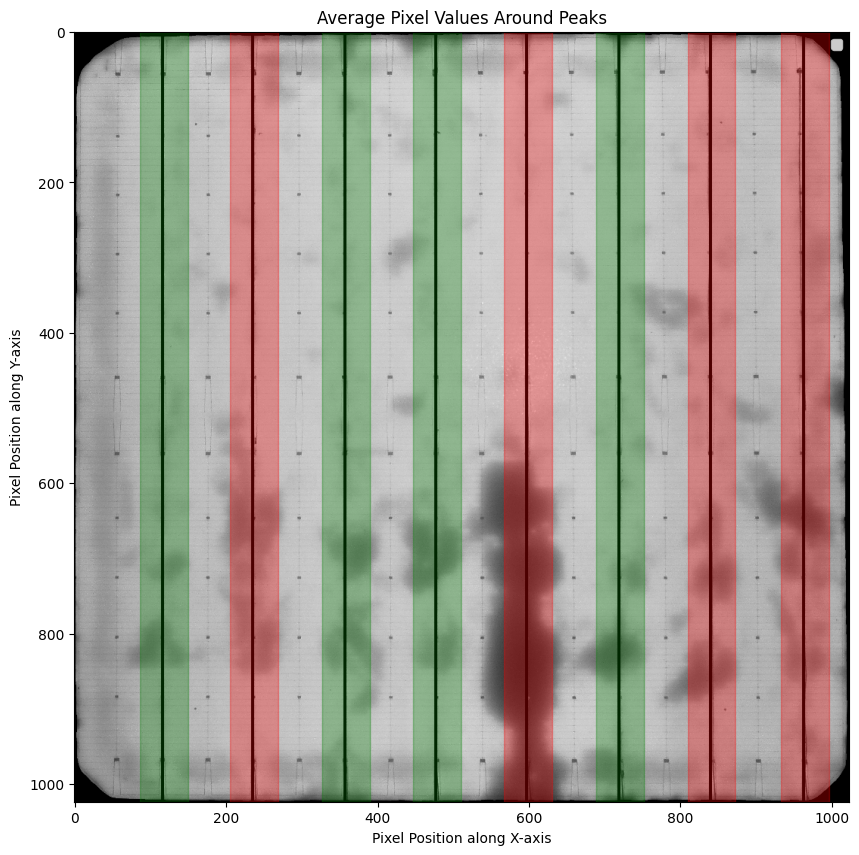

In [61]:
# 设置左右范围（31个像素单位）
offset = math.ceil(1024/(len(peaks)*4+2))
print(offset)
# 计算每个peak左右各31个像素单位的竖直矩形内的平均像素值
analysis_img = masked_image

background = 1
retal = cv2.mean(analysis_img)
# corrosion_thres = 125
corrosion_thres = retal[0]


average_values = []
corrosion_ratio_follow_busbar = []

for peak in peaks:
   # 确保矩形区域在图像范围内
   start_x = max(0, peak - offset)
   end_x = min(analysis_img.shape[1], peak + offset + 1)
   # 提取矩形区域
   rectangle_region = analysis_img[:, start_x:end_x]
   # 计算平均像素值
   mean_value = np.mean(rectangle_region)
   peaks_total_pix = np.sum(rectangle_region  <= 255)
   peaks_busbar_pix = np.sum(rectangle_region  < background)
   peaks_good_pix = np.sum(rectangle_region  > corrosion_thres)

   peaks_PV_pix = np.sum(rectangle_region <= 255) -  np.sum(rectangle_region < 1)
   peaks_busbar_ratio = peaks_busbar_pix/ peaks_total_pix*100
   peaks_corrosion_ratio = (1-peaks_good_pix/peaks_PV_pix)*100

   average_values.append(mean_value)
   corrosion_ratio_follow_busbar.append(peaks_corrosion_ratio)

# 打印每个peak位置及其对应的平均像素值
for i, peak in enumerate(peaks):
   print(f"Peak at x = {peak}, 1. Average pixel value in the region = {average_values[i]:.2f} ; 2. The ratio of buabar corrosion is {corrosion_ratio_follow_busbar[i]:.2f} %")
# 可视化原图和矩形区域
plt.figure(figsize=(10, 10))
# 绘制原图
plt.imshow(masked_image, cmap='gray', aspect='auto')
# 绘制竖直虚线和矩形区域
for i, peak in enumerate(peaks):
   start_x = max(0, peak - offset)
   end_x = min(masked_image.shape[1], peak + offset + 1)

   color = 'red' if corrosion_ratio_follow_busbar[i] > corrosion_ratio else 'green'

   # 绘制矩形区域
   plt.axvspan(start_x, end_x, color=color, alpha=0.3)
   # plt.axvline(x=peak, color='green', linestyle='--', label='Peak Point' if i == 0 else "")

plt.legend()
plt.title('Average Pixel Values Around Peaks')
plt.xlabel('Pixel Position along X-axis')
plt.ylabel('Pixel Position along Y-axis')
plt.show()

Peak at x = 117, 1. Average pixel value in the region = 146.56 ; 2. The ratio of buabar corrosion is 17.36 %
Peak at x = 236, 1. Average pixel value in the region = 146.09 ; 2. The ratio of buabar corrosion is 29.39 %
Peak at x = 358, 1. Average pixel value in the region = 152.83 ; 2. The ratio of buabar corrosion is 17.28 %
Peak at x = 478, 1. Average pixel value in the region = 154.22 ; 2. The ratio of buabar corrosion is 16.22 %
Peak at x = 598, 1. Average pixel value in the region = 123.31 ; 2. The ratio of buabar corrosion is 45.05 %
Peak at x = 720, 1. Average pixel value in the region = 152.05 ; 2. The ratio of buabar corrosion is 16.97 %
Peak at x = 841, 1. Average pixel value in the region = 141.17 ; 2. The ratio of buabar corrosion is 28.09 %
Peak at x = 964, 1. Average pixel value in the region = 132.20 ; 2. The ratio of buabar corrosion is 51.62 %


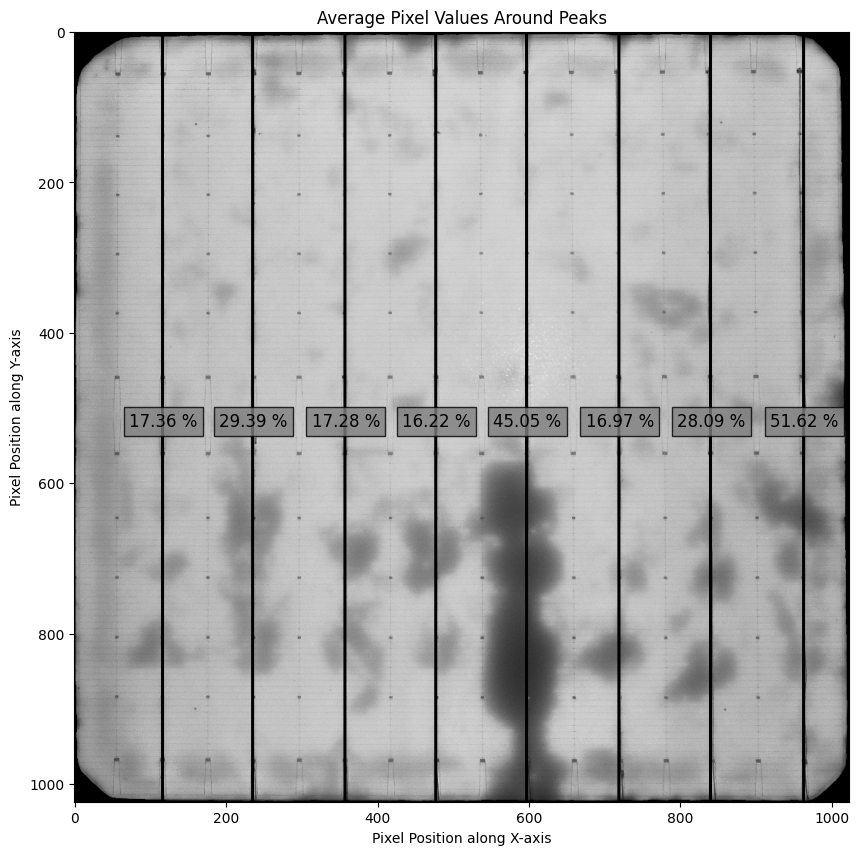

In [79]:
# 打印每个peak位置及其对应的平均像素值
for i, peak in enumerate(peaks):
   print(f"Peak at x = {peak}, 1. Average pixel value in the region = {average_values[i]:.2f} ; 2. The ratio of buabar corrosion is {corrosion_ratio_follow_busbar[i]:.2f} %")
# 可视化原图和矩形区域
plt.figure(figsize=(10, 10))
# 绘制原图
plt.imshow(masked_image, cmap='gray', aspect='auto')
# 绘制竖直虚线和矩形区域
for i, peak in enumerate(peaks):
   # 绘制竖直虚线标识peak位置
   # plt.axvline(x=peak, color='green', linestyle='--')
   # 在peak处标注平均像素值
   plt.text(peak, image.shape[0]// 5 , f'{corrosion_ratio_follow_busbar[i]:.2f} %',
            color='black', fontsize=12, ha='center', va='center',
            bbox=dict(facecolor='grey', alpha=0.8))
# 设置标题和标签
plt.title('Average Pixel Values Around Peaks')
plt.xlabel('Pixel Position along X-axis')
plt.ylabel('Pixel Position along Y-axis')
plt.show()

31 30
The Max Pixel value of PV-EL image is 224.00
66.27289695399148
The health ratio is 65.43 %
The health ratio is 65.22 %
The health ratio is 68.23 %
The health ratio is 68.85 %
The health ratio is 55.05 %
The health ratio is 67.88 %
The health ratio is 63.02 %
The health ratio is 59.02 %


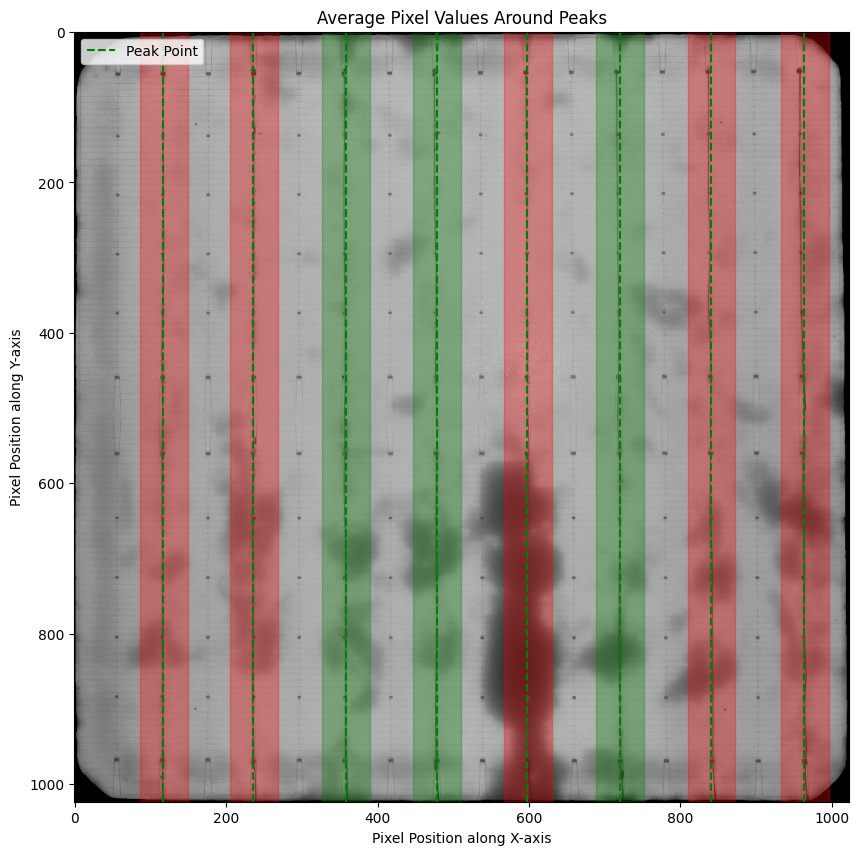

In [59]:
# 设置左右范围（31个像素单位）
busbar_range = 0.25
offset_1 = math.ceil(1024/(len(peaks)*4+2))
offset_2 = math.ceil((peaks[1]-peaks[0])*busbar_range)

print(offset_1, offset_2)
# 计算每个peak左右各31个像素单位的竖直矩形内的平均像素值
analysis_img = masked_image

average_values = []
corrosion_ratio_follow_busbar = []
peak_healthness = []

img_filtered = np.where(masked_image < 1, 0, masked_image)
pixel_counts = np.bincount(img_filtered.flatten(),minlength=256)

   #cv.minMaxLoc()函数原型
minVal, maxVal, minLoc, maxLoc = cv2.minMaxLoc(masked_image)

print('The Max Pixel value of PV-EL image is '+ str('%.2f' %  maxVal))

# The maximum pixel value is constant(255)
# max_pixel_value = 255
# The maximum pixel value of the image(based on image)
max_pixel_value = maxVal
total_pixels = masked_image.size
healthiness = np.sum(pixel_counts * np.arange(256)) / (max_pixel_value * total_pixels) * 100
print(healthiness)

for peak in peaks:
   # 确保矩形区域在图像范围内
   start_x = max(0, peak - offset)
   end_x = min(analysis_img.shape[1], peak + offset + 1)
   # 提取矩形区域
   rectangle_region = analysis_img[:, start_x:end_x]
   # 计算平均像素值
   peak_img_filtered = np.where(rectangle_region < 1, 0, rectangle_region)
   peak_pixel_counts = np.bincount(peak_img_filtered.flatten(),minlength=256)
   peak_max_pixel_value = maxVal
   peak_total_pixels = rectangle_region.size
   peak_healthiness_value = np.sum(peak_pixel_counts * np.arange(256)) / (peak_max_pixel_value * peak_total_pixels) * 100

   peak_healthness.append(peak_healthiness_value)



# 打印每个peak位置及其对应的平均像素值
for i, peak in enumerate(peaks):
   print(f"The health ratio is {peak_healthness[i]:.2f} %")
# 可视化原图和矩形区域
plt.figure(figsize=(10, 10))
# 绘制原图
plt.imshow(new_img, cmap='gray', aspect='auto')
# 绘制竖直虚线和矩形区域
for i, peak in enumerate(peaks):
   start_x = max(0, peak - offset)
   end_x = min(new_img.shape[1], peak + offset + 1)

   color = 'red' if peak_healthness[i] < healthiness else 'green'

   # 绘制矩形区域
   plt.axvspan(start_x, end_x, color=color, alpha=0.3)
   plt.axvline(x=peak, color='green', linestyle='--', label='Peak Point' if i == 0 else "")

plt.legend()
plt.title('Average Pixel Values Around Peaks')
plt.xlabel('Pixel Position along X-axis')
plt.ylabel('Pixel Position along Y-axis')
plt.show()

In [ ]:
analysis_img_colored = cv2.cvtColor(analysis_img, cv2.COLOR_BAYER_BG2BGR)
corr_mask = corr_mask.astype(np.uint8)
# 将掩膜转换为彩色图像
colored_mask = cv2.applyColorMap(colored_mask_custom, cv2.COLORMAP_JET)  # 使用伪彩色图像增强对比度
# 调整透明度，alpha 表示原始图像的权重，beta 表示分段图像的权重
alpha = 1  # 原始图像的透明度
beta = 0.25  # 处理后图像的透明度
blended_image = cv2.addWeighted(analysis_img_colored , alpha, colored_mask, beta, 0)
blended_image_2 = cv2.addWeighted(analysis_img , alpha, colored_mask_custom, beta, 0)
# 显示图像
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
ax1.imshow(analysis_img_colored, cmap='gray')
ax1.set_title('Original Image')
ax2.imshow(corr_mask)
ax2.set_title('Segmented Mask')
ax3.imshow(blended_image)
ax3.set_title('Blended Image')

fig.suptitle('Busbar: {:.2f}% | Corrosion: {:.2f}%'.format(busbar_ratio, corrosion_ratio))
plt.show()
print('total percent of busbar is {:.2f}% , and corrosion is {:.2f}%'.format(busbar_ratio, corrosion_ratio))

In [ ]:
data_show = {
    '':['Image Name', 'Image size','Busbar position','Max Pixel value','Busbar ratio(%)','Corrosion ration(%)'],
    'Value':[filename, '1024*1024',peaks,maxVal,busbar_ratio,corrosion_ratio]
    }
df_show = pd.DataFrame(data_show)
df_show